ПРОЕКТ Рынок заведений общественного питания Москвы

* Цель исследования:

Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места

* Задачи исследования:

Провести предобработку данных, провести их анализ, детализировать исследование для кофейни и подготовить презентацию
* Исходные данные:

Имеем таблицу, содержащую следующие данные: название заведения, его адрес, категорию, информацию о времени работы, координаты, рейтинг, категорию цен, район и количество посадочных мест

Разобьем исследование на этапы:
* Знакомство с данными
* Подготовка данных к исследованию
* Исследовательский анализ данных
* Детализирование исследования
* Подготовка презентации
* Выводы



In [1]:
#сразу импортируем необходимые нам библиотеки

import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import os
import math as mth
import seaborn as sns
import scipy.stats as st
from plotly import graph_objects as go
import plotly.express as px
import json
import plotly.graph_objects as go
import matplotlib.colors as mcolors


import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import warnings
warnings.filterwarnings('ignore')





# Шаг 1. Загрузим данные и изучим общую информацию

In [2]:
#откроем файлы

if os.path.exists('/datasets/moscow_places.csv'):
     data= pd.read_csv('/datasets/moscow_places.csv')
else:
     data = pd.read_csv('moscow_places.csv')

In [3]:
# посмотрим на исходную таблицу

data.head().T

,0,1,2,3,4
name,WoWфли,Четыре комнаты,Хазри,Dormouse Coffee Shop,Иль Марко
category,кафе,ресторан,кафе,кофейня,пиццерия
address,"Москва, улица Дыбенко, 7/1","Москва, улица Дыбенко, 36, корп. 1","Москва, Клязьминская улица, 15","Москва, улица Маршала Федоренко, 12","Москва, Правобережная улица, 1Б"
district,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ
hours,"ежедневно, 10:00–22:00","ежедневно, 10:00–22:00","пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...","ежедневно, 09:00–22:00","ежедневно, 10:00–22:00"
lat,55.878494,55.875801,55.889146,55.881608,55.881166
lng,37.47886,37.484479,37.525901,37.48886,37.449357
rating,5.0,4.5,4.6,5.0,5.0
price,NaN,выше среднего,средние,NaN,средние
avg_bill,NaN,Средний счёт:1500–1600 ₽,Средний счёт:от 1000 ₽,Цена чашки капучино:155–185 ₽,Средний счёт:400–600 ₽


In [4]:
#общая статистика датафрейма

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Датафрейм содержит записи о 8406 заведениях Москвы

Названия столбцов в нижнем регистре, изменять их нет смысла

Тип данных в столбцах нас тоже устраивает

# Шаг 2. Выполним предобработку данных



In [5]:
# посмотрим на дубликаты

data.duplicated().sum()

0

Явные дубликаты отсутствуют

In [6]:
#посмотрим на количество пропусков

data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Наблюдаем присутствие пропусков в некоторых столбцах

Заменять их на нули или медианные значения в данном случае будет некорректно

Оставим пропуски без изменений

## Создадим столбец street с названиями улиц из столбца с адресом

In [7]:
data.head().T

,0,1,2,3,4
name,WoWфли,Четыре комнаты,Хазри,Dormouse Coffee Shop,Иль Марко
category,кафе,ресторан,кафе,кофейня,пиццерия
address,"Москва, улица Дыбенко, 7/1","Москва, улица Дыбенко, 36, корп. 1","Москва, Клязьминская улица, 15","Москва, улица Маршала Федоренко, 12","Москва, Правобережная улица, 1Б"
district,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ
hours,"ежедневно, 10:00–22:00","ежедневно, 10:00–22:00","пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...","ежедневно, 09:00–22:00","ежедневно, 10:00–22:00"
lat,55.878494,55.875801,55.889146,55.881608,55.881166
lng,37.47886,37.484479,37.525901,37.48886,37.449357
rating,5.0,4.5,4.6,5.0,5.0
price,NaN,выше среднего,средние,NaN,средние
avg_bill,NaN,Средний счёт:1500–1600 ₽,Средний счёт:от 1000 ₽,Цена чашки капучино:155–185 ₽,Средний счёт:400–600 ₽


Нам необходимо извлечь из адреса только улицу

Для этого применим метод split, чтобы извлечь  необходимое название улицы

In [8]:
new=data['address'].str.split(',',n=6,expand=True)

In [9]:
data['only_street']=new[1]

In [10]:
# проверим новый столбец

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
 14  only_street        8406 non-null   object 
dtypes: float64(6), int64(1), object(8)
memory usage: 985.2+ KB


In [11]:
# проверим результат

data.head().T

,0,1,2,3,4
name,WoWфли,Четыре комнаты,Хазри,Dormouse Coffee Shop,Иль Марко
category,кафе,ресторан,кафе,кофейня,пиццерия
address,"Москва, улица Дыбенко, 7/1","Москва, улица Дыбенко, 36, корп. 1","Москва, Клязьминская улица, 15","Москва, улица Маршала Федоренко, 12","Москва, Правобережная улица, 1Б"
district,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ
hours,"ежедневно, 10:00–22:00","ежедневно, 10:00–22:00","пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...","ежедневно, 09:00–22:00","ежедневно, 10:00–22:00"
lat,55.878494,55.875801,55.889146,55.881608,55.881166
lng,37.47886,37.484479,37.525901,37.48886,37.449357
rating,5.0,4.5,4.6,5.0,5.0
price,NaN,выше среднего,средние,NaN,средние
avg_bill,NaN,Средний счёт:1500–1600 ₽,Средний счёт:от 1000 ₽,Цена чашки капучино:155–185 ₽,Средний счёт:400–600 ₽


Теперь мы имеем новый столбец с отдельным названием улицы, где расположено заведение

## Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [12]:
# посмотрим на уникальные значения столбца с временем работы

data['hours'].value_counts()

ежедневно, 10:00–22:00                                                  759
ежедневно, круглосуточно                                                730
ежедневно, 11:00–23:00                                                  396
ежедневно, 10:00–23:00                                                  310
ежедневно, 12:00–00:00                                                  254
                                                                       ... 
пн-пт 09:30–19:30; сб,вс 10:00–18:00                                      1
пн-пт 07:30–20:00; сб,вс 10:00–20:00                                      1
пн-пт 08:00–22:00; сб 12:00–22:00                                         1
пн,вт 08:00–22:00; ср-пт 08:00–23:00; сб 10:00–23:00; вс 10:00–22:00      1
пн,вт 12:00–22:30; чт 14:30–00:30; пт,сб 16:30–04:30; вс 15:30–22:30      1
Name: hours, Length: 1307, dtype: int64

In [13]:
# добавим новый столбец со значением True, если заведение работает круглосуточно и ежедневно. Если нет - значение False

hour_dict={'ежедневно, круглосуточно':True}
data['is_24/7']=data['hours'].map(hour_dict).fillna(False)

In [14]:
# проверяем результат

data['is_24/7'].unique()

array([False,  True])

In [15]:
data.head().T

,0,1,2,3,4
name,WoWфли,Четыре комнаты,Хазри,Dormouse Coffee Shop,Иль Марко
category,кафе,ресторан,кафе,кофейня,пиццерия
address,"Москва, улица Дыбенко, 7/1","Москва, улица Дыбенко, 36, корп. 1","Москва, Клязьминская улица, 15","Москва, улица Маршала Федоренко, 12","Москва, Правобережная улица, 1Б"
district,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ
hours,"ежедневно, 10:00–22:00","ежедневно, 10:00–22:00","пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...","ежедневно, 09:00–22:00","ежедневно, 10:00–22:00"
lat,55.878494,55.875801,55.889146,55.881608,55.881166
lng,37.47886,37.484479,37.525901,37.48886,37.449357
rating,5.0,4.5,4.6,5.0,5.0
price,NaN,выше среднего,средние,NaN,средние
avg_bill,NaN,Средний счёт:1500–1600 ₽,Средний счёт:от 1000 ₽,Цена чашки капучино:155–185 ₽,Средний счёт:400–600 ₽


Были добавлены два новых столбца: с названием улицы, где расположено заведение и еще один столбец со значением True, если заведение работает ежедневно и круглосуточно

# Шаг 3. Анализ данных

## Какие категории заведений представлены в данных? Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Ответим на вопрос о распределении заведений по категориям

In [16]:
# посмотрим на уникальныне значения в столбце с категориями

data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [17]:
# сгруппируем данные и создадим таблицу для графика

data_cat=data.groupby('category')[['category']].count()
data_cat.columns=['total_count']
data_cat=data_cat.reset_index().sort_values(by='total_count',ascending=True)
data_cat.columns=['категория','количество']
data_cat

,категория,количество
1,булочная,256
7,столовая,315
2,быстрое питание,603
5,пиццерия,633
0,"бар,паб",765
4,кофейня,1413
6,ресторан,2043
3,кафе,2378


In [18]:
# строим график

fig=px.bar(data_cat,x='количество',y='категория',text='количество')
fig.update_layout(title='График количества обьектов питания по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория')
fig.show()

Можем наблюдать трех лидеров по категориям: больше всего кафе, ресторанов и кофеен

Меньше всего - столовых и булочных

Вероятно, эпоха столовые и булочных канула в лету и теперь популряными заведениями стали кафе и как и всегда, рестораны

## Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Проанализируем результаты и сделаем выводы

In [19]:
# группируем данные и создадим таблицу для графика

data_mesta=data.groupby('category')[['seats']].median()
data_mesta.columns=['total_seats']
data_mesta=data_mesta.reset_index().sort_values(by='total_seats',ascending=True)
data_mesta.columns=['категория','количество посадочных мест']
data_mesta

,категория,количество посадочных мест
1,булочная,50.0
5,пиццерия,55.0
3,кафе,60.0
2,быстрое питание,65.0
7,столовая,75.5
4,кофейня,80.0
0,"бар,паб",82.5
6,ресторан,86.0


In [20]:
# строим график

fig=px.bar(data_mesta,x='количество посадочных мест',y='категория',text='количество посадочных мест')
fig.update_layout(title='График медианного количества посадочных мест в местах по категориям',
                   xaxis_title='Количество мест',
                   yaxis_title='Категория')
fig.show()

Как можно видеть, в среднем больше всего посадочных мест в ресторанах и барах, а меньше всего - в пиццериях и булочных

И эти результаты кажутся вполне разумными: булочные вероятно, обладают небольшими площадями и имеют небольшое количество посадочных мест, в отличие от больших ресторанов 

## Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

In [21]:
# посмотрим на уникальные значения столбца , где обозначено, является ли заведение сетевым

data['chain'].unique()

array([0, 1])

Если значение 1 - знаячит является, если 0 - не является

Замения эти значения на более удобные

In [22]:
# заменим значения в столбце chain

data['chain']=data['chain'].map({1:'сетевое',0:'не сетевое'})
data['chain'].unique()

array(['не сетевое', 'сетевое'], dtype=object)

In [23]:
# создадим новый датафрейм со значениями столбца chain

data_chain=pd.DataFrame(data['chain'].value_counts()).reset_index()
data_chain

,index,chain
0,не сетевое,5201
1,сетевое,3205


In [24]:
# строим график

fig=go.Figure(data=[go.Pie(labels=data_chain['index'],values=data_chain['chain'])])
fig.update_layout(title='Соотношение сетевых и несетевых заведений',
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Тип заведения',
                                    showarrow=False)])
fig.show()
                             

Как мы видим, 2/3 из всех заведений относятся к несетевым

## Какие категории заведений чаще являются сетевыми? Исследуем данные и ответим на вопрос графиком

In [25]:
# сгруппируем данные


data_setevie=data.groupby(['chain','category'])[['name']].count()
data_setevie.columns=['count']
data_setevie=data_setevie.reset_index().sort_values(by='count',ascending=False)
data_setevie.columns=['сетевые/несетевые','категория','количество']
data_setevie

,сетевые/несетевые,категория,количество
3,не сетевое,кафе,1599
6,не сетевое,ресторан,1313
11,сетевое,кафе,779
14,сетевое,ресторан,730
12,сетевое,кофейня,720
4,не сетевое,кофейня,693
0,не сетевое,"бар,паб",596
2,не сетевое,быстрое питание,371
13,сетевое,пиццерия,330
5,не сетевое,пиццерия,303


In [26]:
# строим график

fig = px.bar(data_setevie.sort_values(by='количество',ascending=True),x='количество',y='категория',color='сетевые/несетевые',text='количество')
fig.update_layout(title='График количества  сетевых/несетевых заведений по категориям',
                 xaxis_title='Количество ',
                   yaxis_title='Категория')
fig.show()

Кафе по большей части являются несетевыми заведениями, как и рестораны и бары

Среди пиццерий - примерно равное количество сетевых и несетевых заведений

Среди кофеен - число сетевых несколько больше, чем несетевых

Можно отметить, что только в трех категориях число сетевых заведений больше несетевых: в кофейнях, булочных и пиццериях

## Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Построим подходящую для такой информации визуализацию. 

Отфильтруем только сетевые заведения, сгруппируем по названию и оставим топ-15

In [27]:
# подготовим данные

data_set=data.query('chain=="сетевое"')
data_nazvanie=data_set.groupby(['name','category','district'])[['name']].count()
data_nazvanie.columns=['cnt']
data_nazvanie=data_nazvanie.reset_index().sort_values(by='cnt',ascending=False).head(15)
data_nazvanie.columns=['название','категория','район','количество']
data_nazvanie

,название,категория,район,количество
1948,Шоколадница,кофейня,Центральный административный округ,38
436,Prime,ресторан,Центральный административный округ,36
1132,Кулинарная лавка братьев Караваевых,кафе,Центральный административный округ,32
149,Cofix,кофейня,Центральный административный округ,20
1944,Шоколадница,кофейня,Западный административный округ,17
360,One Price Coffee,кофейня,Центральный административный округ,15
980,КОФЕПОРТ,кофейня,Центральный административный округ,15
1098,Кофемания,кофейня,Центральный административный округ,14
1945,Шоколадница,кофейня,Северный административный округ,13
1782,Хлеб Насущный,булочная,Центральный административный округ,12


In [28]:
# построим график

fig = px.bar(data_nazvanie.sort_values(by='количество',ascending=False),x='количество',y='название',text='количество')
fig.update_layout(title='ТОП-15 сетевых заведений',
                 xaxis_title='Количество заведений',
                   yaxis_title='Название',
                 width=1000, 
                  height=800)
fig.show()

In [29]:
# построим график

fig = px.bar(data_nazvanie.sort_values(by='количество',ascending=False),y='количество',x='категория',text='количество')
fig.update_layout(title='ТОП-15 сетевых заведений',
                 xaxis_title='Категория',
                   yaxis_title='Количество',
                 width=1000, 
                  height=800)
fig.show()

In [30]:
fig = px.bar(data_nazvanie.sort_values(by='количество',ascending=False),x='район',y='количество',text='категория')
fig.update_layout(title='ТОП-15 сетевых заведений',
                 xaxis_title='Район',
                   yaxis_title='Количество',
                 width=1000, 
                  height=800)
fig.show()

Среди сетевых заведений можем наблюдать широко известные места общественного питания, такие как Шоколадница, Яндекс Лавка, Кофемания, КОФЕПОРТ и другие

Наиболее широко представлена Шоколадница

8 из ТОП-15 заведений находятся в Центральном административном округе

Кофейни очень популярны среди москвичей: из ТОП-15 заведений 9 - кофейни

Вероятно, стоит присмотрется к кофейням как к хорошему источнику вложения средств

## Какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам

In [31]:
# подготовим данные для анализа

data_raioni=data.groupby(['district','category'])[['district']].count()
data_raioni.columns=['cnt']
data_raioni=data_raioni.reset_index().sort_values(by='district',ascending=False)
data_raioni.columns=['район','категория','количество']
data_raioni.sort_values(by='количество',ascending=False)

,район,категория,количество
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",23
39,Северо-Западный административный округ,столовая,18
63,Юго-Западный административный округ,столовая,17
49,Юго-Восточный административный округ,булочная,13


In [32]:
# строим график

fig = px.bar(data_raioni.sort_values(by='количество',ascending=False),x='район',y='количество'
             ,color='категория',text='количество')
fig.update_layout(title='График общего количества заведений по районам Москвы  и по разным категориям',
                 yaxis_title='Количество заведений',
                   xaxis_title='Название района',
                 width=1010, 
                  height=900)
fig.show()

Можно отметить следующее:

* В лидерах по общему количеству заведений - Центральный административный округ, в нем находится наибольшее количество ресторанов, кафе и кофеен

* Меньше всего заведений - в Северо-Западном административном округе, возможно, следует обратить внимание на этот район как на перспективный при возможном открытии нового обьекта питания

* В целом кафе, рестораны и кофейни являются наиболее часто встречающимеся заведениями

* Количество булочных в нашем списке - наименьшее по сравнению с другими заведениями, это касается всех округов

## Визуализируем распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [33]:
# подготовим данные, округлив средний рейтинг до двух знаков после запятой

data_rating=data.groupby('category')['rating'].mean().round(2)
data_rating=data_rating.reset_index().sort_values(by='rating',ascending=False)
data_rating.columns=['категория','рейтинг']
data_rating

,категория,рейтинг
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [34]:
# построим график

fig = px.bar(data_rating.sort_values(by='рейтинг',ascending=True),x='категория',y='рейтинг',text='рейтинг')
fig.update_layout(title='График среднего рейтинга по категориям заведений',
                 xaxis_title='Категория заведения',
                   yaxis_title='Средний рейтинг')
fig.show()

Как видно из графика и таблицы, усредненные рейтинги у разных типов заведений хоть и отличаются, но не сильно: все они находятся в пределах от 4 до 4,5 баллов

В лидерах по средним рейтингам - бары и пабы, самые низкие средние рейтинги - у заведений быстрого питания

## Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [35]:
# подготовим данные для графика

data_distr_rating=data.groupby('district', as_index=False)['rating'].agg('median').\
sort_values(by='rating',ascending=False)
data_distr_rating.columns=['район','рейтинг']
data_distr_rating


,район,рейтинг
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


In [36]:
# читаем файл и сохраняем в переменной

with open('admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [37]:
# загружаем JSON-файл с границами округов Москвы

try:
    state_geo = 'admin_level_geomap.geojson'
except:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_distr_rating,
    columns=['район', 'рейтинг'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам Москвы',
).add_to(m)

# выводим карту
m

Наглядно видно, что наивысший рейтинг у заведений, расположенных в центре Москвы, в Цетральном административном округе

Вероятно, там находятся самые популярные заведения, которым пользователи ставили выскоие рейтинги

Самые низкие рейтинги - в Юго-Восточном и Северо-Восточном административных округах

## Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium

In [38]:
moscow_lat, moscow_lng = 55.751244, 37.618423

In [39]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

In [40]:
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

## Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам

In [41]:
# подготовим данные для исследования

data_top15=data.groupby('only_street')[['name']].count().sort_values\
(by='name',ascending=False).head(15)

top_15=data_top15.index.values.tolist()

data_new=data.query('only_street in @top_15')
 
top=data_new.groupby(['only_street','category'])[['name']].count().reset_index()

top.columns=['улица','категория','количество']

top=top.reset_index().sort_values(by='количество',ascending=False)

top

,index,улица,категория,количество
93,93,проспект Мира,кафе,53
63,63,МКАД,кафе,45
96,96,проспект Мира,ресторан,45
94,94,проспект Мира,кофейня,36
70,70,Профсоюзная улица,кафе,35
...,...,...,...,...
58,58,Люблинская улица,пиццерия,1
83,83,проспект Вернадского,булочная,1
23,23,Кутузовский проспект,булочная,1
66,66,МКАД,столовая,1


In [42]:
# строим график

fig = px.bar(top.sort_values(by='количество',ascending=False),x='улица',y='количество'
             ,color='категория',text='количество')
fig.update_layout(title='График  ТОП-15 улиц Москвы по количеству заведений и по разным категориям',
                 yaxis_title='Количество заведений',
                   xaxis_title='Название улицы',
                 width=1000, 
                  height=700)
fig.show()

Можно отметить следущее: 

* В ТОП-15 улиц по количеству заведений лидерами являются улицы юга столицы: Ленинский проспект, Профсоюзная улица и проспект Вернадского 

* Больше всего заведений - на Проспекте Мира

* По категориям лидируют рестораны, кафе и кофейни

* На МКАД - одни сплошные кафе

## Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [43]:
# подготовим данные

data_one_cafe=data.groupby('only_street')['name'].count().reset_index()
data_one_cafe.columns=['улица','количество']
data_one_cafe=data_one_cafe.query('количество==1')


In [44]:
# проверяем результат

print(data_one_cafe['количество'].min(),data_one_cafe['количество'].max())

1 1


In [45]:
data_one_cafe.shape

(458, 2)

Мы видим, что улиц с одним заведением питания в Москве 458

Возможно, это небольшие улочки, где просто нет места для нескольких заведений

Посмотрим, в каких районах они расположены

In [46]:
# подготовим данные

data_one_place=data[['only_street','district']].value_counts().reset_index()
data_one_place.columns=['only_street','district','cnt']
data_one_place=data_one_place[data_one_place['cnt']==1]
data_one_place.columns=['улица','район','количество']
data_one_place


data_one=data_one_place.groupby('район')[['район']].count()
data_one.columns=['cnt']
data_one=data_one.reset_index().sort_values(by='cnt',ascending=False)
data_one.columns=['район','количество']
data_one

,район,количество
5,Центральный административный округ,148
3,Северо-Восточный административный округ,56
2,Северный административный округ,53
0,Восточный административный округ,52
8,Южный административный округ,50
6,Юго-Восточный административный округ,42
1,Западный административный округ,36
4,Северо-Западный административный округ,21
7,Юго-Западный административный округ,18


In [47]:
# построим график

fig = px.bar(data_one.sort_values(by='количество',ascending=True),x='количество',y='район',text='количество')
fig.update_layout(title='График количества улиц с одним заведением по районам',
                 xaxis_title='Количество улиц',
                   yaxis_title='Название района')
fig.show()

Можно наблюдать, что больше всего улиц только с одним заведением питания в Центральном административном округе - 140 штук

Наименьшее количество таких улиц - в Юго-Западном административном округе

Вероятно, как раз в центре Москвы много небольших улочек, где как раз и расположено по одному заведению, для большего количества просто нету места, или же можно предположить, что арендная палата на таких улицах высока и инвесторы не готовы вкладывать деньги в заведения на таких улицах

## Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других.

In [48]:
data_mediana_distr=data.groupby('district')[['middle_avg_bill']].median()
data_mediana_distr=data_mediana_distr.reset_index().sort_values(by='middle_avg_bill',ascending=False)
data_mediana_distr.columns=['район','средний чек']
data_mediana_distr

,район,средний чек
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [49]:
# загружаем JSON-файл с границами округов Москвы

try:
    state_geo = 'admin_level_geomap.geojson'
except:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_mediana_distr,
    columns=['район', 'средний чек'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.5,
    legend_name='Медианный  средний чек по районам Москвы',
).add_to(m)

# выводим карту
m

Можем наблюдать следующее:

* Наивысший средний чек у заведений, расположенных в Центральном и Западном административных округах, престижных и дорогих районах Москвы. Вероятно, именно там и расположены дорогие рестораны и другие заведения, где посетителям придеться оставить немалую сумму за посещение

* Наименьший средний чек имеют заведения, расположенные в Южном и Юго-Восточном административном округах столицы

* Разница между средними чеками в самых дорогих и самых дешевых заведениях составляет 50 процентов

# Шаг 4. Детализируем исследование: открытие кофейни



## Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?


Для детализации исследования выделим из датасета только одни кофейни

In [50]:
# отфильтруем одни кофейни и посмотрим на их количество

data_cofee=data[data['category']=='кофейня']
data_cofee.shape

(1413, 16)

Мы видим, что у нас в распоряжении данные о 1413 кофейнях

Посмотрим на их географическое расположение

In [51]:
# подготовим данные

data_cofee_distr=data_cofee.groupby('district')[['district']].count()
data_cofee_distr.columns=['cnt']
data_cofee_distr=data_cofee_distr.reset_index().sort_values(by='cnt',ascending=False)
data_cofee_distr.columns=['район','количество']
data_cofee_distr

,район,количество
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [52]:
# загружаем JSON-файл с границами округов Москвы

try:
    state_geo = 'admin_level_geomap.geojson'
except:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_cofee_distr,
    columns=['район', 'количество'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.5,
    legend_name='Количество кофеен по районам Москвы',
).add_to(m)

# выводим карту
m

Большинство кофеен расположено в Центральном административном округе Москвы

Наименьшее количество - в Северо-Западном, Юго-Восточном и Юго-Западном

## Есть ли круглосуточные кофейни?

In [53]:
# проверим наличие круглосуточных кофеен

data_cofee_24=data_cofee[data_cofee['is_24/7']==True]
data_cofee_24.shape

(59, 16)

Видим, что в нашем распоряжении есть 59 круглосуточных кофеен

In [54]:
# подготовим данные

cofee_24=data_cofee_24.groupby('district')[['name']].count()
cofee_24.columns=['cnt']
cofee_24=cofee_24.reset_index().sort_values(by='cnt',ascending=False)
cofee_24.columns=['район','количество']
cofee_24

,район,количество
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [55]:
# загружаем JSON-файл с границами округов Москвы

try:
    state_geo = 'admin_level_geomap.geojson'
except:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofee_24,
    columns=['район', 'количество'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.5,
    legend_name='Количество круглосуточных кофеен по районам Москвы',
).add_to(m)

# выводим карту
m

Большинство круглосуточных кофеен, как видно на карте, расположены в Центральном округе Москвы

## Какие у кофеен рейтинги? Как они распределяются по районам?

In [56]:
#подготавляваем данные

cofee_rating=data_cofee.groupby('district')['rating'].median()
cofee_rating=cofee_rating.reset_index().sort_values(by='rating',ascending=False)
cofee_rating.columns=['район','рейтинг']
cofee_rating

,район,рейтинг
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
1,Западный административный округ,4.2


In [57]:
# загружаем JSON-файл с границами округов Москвы

try:
    state_geo = 'admin_level_geomap.geojson'
except:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofee_rating,
    columns=[ 'район','рейтинг'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.5,
    legend_name='Рейтинг кофеен по районам Москвы',
).add_to(m)

# выводим карту
m

В целом, рейтинг равномерно распределен по всей Москве

И только в Западном административном округе он чуть ниже, чем в других районах столицы

Вероятно, этот округ не стоит рекомендовать для инвестиций в заведения питания

## На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

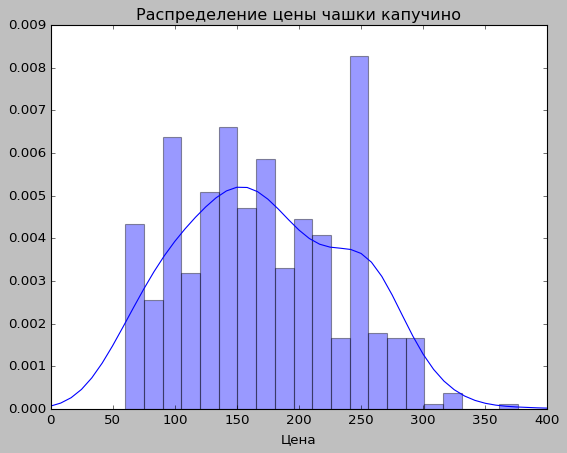

In [58]:
# построим гистрограмму распределения средней стоимости чашки капучино

plt.style.use('classic')
sns.distplot(data_cofee['middle_coffee_cup'], bins=100,kde=True) 
plt.xlim(0, 400)
plt.title('Распределение цены чашки капучино')
plt.xlabel('Цена')
plt.ylabel('')
plt.show()

Можно отметить, что цена варьируется от 70 до 300 рублей за чашку

Виден пик цены в районе 250 рублей, такая стоимость встречается очень часто 

Вероятно, на эту цифру и стоит ориентироваться при открытии кофейни

Стоимость дороже 300 рублей и меньше 70 - очень редка



# Шаг 5. ВЫВОДЫ



* Было проведено исследование заведений общественного питания Москвы. В нашем распоряжении были данные на лето 2022 года

* В ходе предобработки данных не было выявлено явных дубликатов. Что касается пропусков, в некоторых столбцах они присутствовали. Это могло быть связано с ошибками ввода данных или нежеланием их обнародования. Заполнить пропуски корректным образом в данном случае не представлялось возможным, поэтому было принято решение продолжать исследование и оставить пропуски без изменений

* Мы располагали данными по восьми различным категориям заведений. Наибольшее количество среди них - кафе и рестораны, наиболее редко представлены булочные и столовые

* Наибольшее среднее количество посадочных мест - в ресторанах, наименьшее - в булочных, что вполне логично 

* Существенная доля (порядка 62 процентов ) заведений относится к несетевым. При этом среди сетевых заведений наиболее часто встречаются кафе и рестораны. Лидером среди сетевых заведений является широко известное кафе Шоколадница

* Рейтинги заведений по категория близки друг к другу, заведения быстрого питания обладают наименьшим рейтингом

* Касаемо географического расположения, наибольшее количество заведений находится в центральном административном округе Москвы. Основная масса из них - кафе и рестораны. Доля кафе велика по сравнению с дугими категориями заведений во всех районах столицы

* Наибольшее количество заведений находится на Проспекте Мира

* Средние чеки с наибольшими суммами представлены в Центральном и Западном админстративном округах

Если детализировать исследование и рассмтаривать кофейни как потенциальный обьект вложения средств, отметим следующее:

* БОльшая часть кофеен расположена в Центральном округе

* Количество круглосуточных кофеен невелико в имеющихся данных

* Рейтинг кофеен равномерно распределен по районам, и лишь в Западном округе он немного ниже остальных

* Что касается стоимости чашки капучино, есть смысл оринтироваться на цифру 250 рублей за чашку, она является наиболее распространенной


# РЕКОМЕНДАЦИИ

После проведенного исследования, можно порекомендовать инвесторам обратить свое внимание на кофейни как тип заведения общественного питания Москвы: кофейни популярны среди москвичей, имеют небольшое количество посадочных мест, что вероятно позволит уменьшить стоимость арендной платы за помещение

Возможно, в будущем получится сорфмировать сеть заведений подобного типа, ведь сетевое распространение не так сильно развито и может иметь потенциал для бизнеса

Они имеют неплохой средний рейтинг, при этом в ТОП-15 улиц Москвы по количеству заведений лишь на двух из них присутствуют кофейни, что может свидетельствовать о хорошем потенциале и невысокой конкуренции для инвесторов

Касаемо географического расположения, не стоит обращать внимание на Центральный административнй округ: там большое количество заведений подобного типа и много улиц лишь с одним заведением

Можно присмотреться к району Профсоюзной улицы, Проспекта Вернадского: на этих улицах нет кофеен, в целом в этом районе кофейни имеют хорошие рейтинги, при этом средний чек заведений находится на хорошем уровне

Возможно стоит обратить внимание на круглосуточные кофейни, их совсем немного, это может привлечь посетителей и повысить прибыль инвесторов

Что касается стоимости кофе, можно ориентироваться на 250 рублей за чашку прекрасного капучино - ведь что может быть лучше для начала продуктивного дня!

Презентация: <https://disk.yandex.ru/i/QUruT7tGtRcZ0g>